### Scikit-Learn의  BOW 인코더

Scikit_Learn의 feature_extracction 서브패키지와 feature_extraction.text 서브패키지는 다음과 같은 BOW 인코더 클래스를 제공


    - CountVectorizer:
        - 모든 집합에서 단어 토큰을 생성하고 각 단어의 수를 세어 BOW 인코딩 벡터를 만든다.
        
    - TfidfVectorizer:
         - CountVectorizer와 비슷하지만 TF-IDF 방식으로 단어의 가중치를 조정한 BOW 인코딩 벡터를 만든다.
         
     - HashingVectorizer:
         - 해시함수(hash function)를 사용하여 적은 메모리와 빠른 속도로 BOW 인코딩 벡터를 만든다.

### Vectorizer 클래스 기능

CountVectorizer는 다음과 같은 세가지 작업을 수행한다.

1. 문서를 토큰 리스트로 변환한다.
2. 각 문서에서 토큰의 출현 빈도를 센다.
3. 각 문서를 BOW인코딩 벡터로 변환한다.

### Vectorize 클래스 사용법

1. 클래스 객체 생성
2. 말뭉치를 넣고 fit메서드 생성
3. vocabulary_ 속성에 단어장이 자동 생성됨
4. transform 메서드로 다른 문서를 BOW 인코딩
5. BOW 인코딩 결과는 Sparse 행렬로 만들어지므로 toarray 메서드로 보통행렬로 변환 필요

### Vectorizer 인수

다음과 같은 인수를 가진다.

    - stop_words : 문자열['english'], 리스트 또는 None[디폴트]
        - stop words 목록. 'english'이면 영어용 스탑 워드 사용.
        
    - max_df : 정수 또는 [0.0, 1.0]사이의 실수, 디폴트 1
        - 단어장에 포함되기 위한 최대 빈도
        
    - max_df : 정수 또는 [0.0, 1.0]사이의 실수, 디폴트 1
        - 단어장에 포함되기 위한 최소 빈도
        
    - ngram_range : (min_n, max_n) 튜플
        - n-그램 범위
        
    - analyzer : 문자열('word', 'char', 'char_wb') 또는 함수
        - 단어 n-그램, 문자 n-그램, 단어 내의 문자 n-그램
        
    - token_pattern : string
        - 토큰 정의용 정규표현식
        
    - tokenizer : 함수 또는 Non(디폴트)
        - 토큰 생성 함수

### N-그램

    - 단어나 형태소에서 토큰을 생성할 때
    
        - 1개의 단어로 하나의 토큰을 만들면 : 모노그램(monogram, 1-gram)
        - 2개의 단어로 하나의 토큰을 만들면 : 바이그램(bigram, 2-gram)
        - 3개의 단어로 하나의 토큰을 만들면 : 트라이그램(trigram, 3-gram)
        
    -I + am + a + boy
    
        - 1-gram: "I", "am", "a", "boy"
        - 2-gram: "I am", "am a", "a boy"
        - 3-gram: "I am a", "am a boy"

### step 1:말뭉치 만들기

In [13]:
corpus = [
    'This is the first document.',
    'This is the second second document.',
    'And the third one.',
    'Is this the first document?',
    'The last document?'
]

### step 2: 인코더 객체 생성

In [14]:
from sklearn.feature_extraction.text import CountVectorizer

vect = CountVectorizer()
vect

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=1,
                ngram_range=(1, 1), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

### step 3: 말뭉치 학습 및 단어장 생성

In [15]:
vect.fit(corpus)
vect.vocabulary_
# 기본적으로 순서는 알파벳 순서이지만 항상 그런 것은 아니어서 순서는 신경쓰지 않아도 됨.

{'this': 9,
 'is': 3,
 'the': 7,
 'first': 2,
 'document': 1,
 'second': 6,
 'and': 0,
 'third': 8,
 'one': 5,
 'last': 4}

### step 4: 문장을 BOW 인코딩

In [16]:
vect.transform([ 'This is the second documents.']).toarray()

array([[0, 0, 0, 1, 0, 0, 1, 1, 0, 1]], dtype=int64)

- 말뭉치에서 학습하지 못한 단어는 무시된다.

In [17]:
vect.transform(['Something completely new']).toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=int64)

### step 5 : 불용어 사용

In [19]:
vect = CountVectorizer(stop_words=["and", "is", "the", "this"]).fit(corpus)
vect.vocabulary_

{'first': 1, 'document': 0, 'second': 4, 'third': 5, 'one': 3, 'last': 2}

In [22]:
vect = CountVectorizer(stop_words="english").fit(corpus)
vect.vocabulary_

{'document': 0, 'second': 1}

### step 6: 빈도수 사용

max_df, min_df 인수를 사용하여 문서에서 토큰이 나타난 횟수를 기준으로 단어장을 구성할 수도 있다. 토큰의 빈도가 max_df로 지정한 값을 초과하거나 min_df로 지정한 값보다 작은 경우에는 무시한다. 인수 값은 정수인 경우 횟수, 부동소수점인 경우 비중을 뜻한다.

In [23]:
vect = CountVectorizer(max_df=4, min_df=2).fit(corpus)
vect.vocabulary_

{'this': 3, 'is': 2, 'first': 1, 'document': 0}

In [24]:
vect.stop_words_

{'and', 'last', 'one', 'second', 'the', 'third'}

### step 7: N-그램 적용

In [25]:
vect = CountVectorizer(ngram_range=(1, 2)).fit(corpus)  # N-그램 1개짜리 2개짜리 써라
vect.vocabulary_

{'this': 21,
 'is': 5,
 'the': 14,
 'first': 3,
 'document': 2,
 'this is': 22,
 'is the': 6,
 'the first': 15,
 'first document': 4,
 'second': 11,
 'the second': 17,
 'second second': 13,
 'second document': 12,
 'and': 0,
 'third': 19,
 'one': 10,
 'and the': 1,
 'the third': 18,
 'third one': 20,
 'is this': 7,
 'this the': 23,
 'last': 8,
 'the last': 16,
 'last document': 9}

### 해시 트릭 (Hash Trick)

    - CountVectorizer 는 모든 작업을 메모리 상에서 수행
    - 처리할 문서의 크기가 커지면 단어장 딕셔너리가 커진다.
    - 실행속도가 느려지거나 실행히 불가능해진다.
    
    - HashingVectorizer를 사용하면 해시함수(Hash function)를 사용
    - 단어에 대한 인덱스 번호를 수식으로 생성
    - 사전 메모리가 없고 실행시간을 줄일 수 있다.
    - 단어의 충돌이 있을 수 있다.

### Gensim 패키지

    - Bag of Words 인코딩
    - TF-IDF 인코딩
    - 토픽 모델링

### Gensim 패키지 설치

pip install gensim

### Gensim의 BOW 인코딩 기능

    - Dictionary 클래스 이용
        - token2id 속성으로 사전 저장
        - doc2bow 메서드로 BOW 인코딩
        
    - TfidModel 클래스를 이용하면 TF-IDF 인코딩도 가능

### step 1:말뭉치 만들기

In [1]:
corpus = [
    'This is the first document.',
    'This is the second second document.',
    'And the third one.',
    'Is this the first document?',
    'The last document?'
]

### step 2: 토큰 리스트 생성

In [5]:
# split을 사용할 수 있다는 것을 보여주는 것.
token_list = [[text for text in doc.split()] for doc in corpus]
token_list

[['This', 'is', 'the', 'first', 'document.'],
 ['This', 'is', 'the', 'second', 'second', 'document.'],
 ['And', 'the', 'third', 'one.'],
 ['Is', 'this', 'the', 'first', 'document?'],
 ['The', 'last', 'document?']]

### step 3: Dictionary 객체 생성

In [6]:
from gensim.corpora import Dictionary

dictionary = Dictionary(token_list)
dictionary.token2id

{'This': 0,
 'document.': 1,
 'first': 2,
 'is': 3,
 'the': 4,
 'second': 5,
 'And': 6,
 'one.': 7,
 'third': 8,
 'Is': 9,
 'document?': 10,
 'this': 11,
 'The': 12,
 'last': 13}

### step 4: BOW 인코딩

In [17]:
#0 번째 단어가 몇 번 나왔다. 와 같은 sparse_matix 형태로 나옴
term_metrix = [dictionary.doc2bow(token) for token in token_list]
term_metrix

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1)],
 [(0, 1), (1, 1), (3, 1), (4, 1), (5, 2)],
 [(4, 1), (6, 1), (7, 1), (8, 1)],
 [(2, 1), (4, 1), (9, 1), (10, 1), (11, 1)],
 [(10, 1), (12, 1), (13, 1)]]

### step 5: TF-IDF 인코딩

In [19]:
from gensim.models import TfidfModel

tfidf = TfidfModel(term_metrix)   # 일반적인 count_matrix의 숫자만 바꿔준것?!

for doc in tfidf[term_metrix]:
    print("dox:")
    for k, v in doc:
        print(k, v)

dox:
0 0.49633406058198626
1 0.49633406058198626
2 0.49633406058198626
3 0.49633406058198626
4 0.12087183801361165
dox:
0 0.25482305694621393
1 0.25482305694621393
3 0.25482305694621393
4 0.0620568558708622
5 0.8951785160431313
dox:
4 0.07979258234193365
6 0.5755093812740171
7 0.5755093812740171
8 0.5755093812740171
dox:
2 0.3485847413542797
4 0.08489056411237639
9 0.6122789185961829
10 0.3485847413542797
11 0.6122789185961829
dox:
10 0.37344696513776354
12 0.6559486886294514
13 0.6559486886294514


### 토픽 모델링

### step 1: 텍스트 데이터 다운로드

In [20]:
from sklearn.datasets import fetch_20newsgroups

newsgroups = fetch_20newsgroups(
    categories=["comp.graphics", "rec.sport.baseball", "sci.med"])

### step 2: 명사 추출

In [22]:
%%time
from nltk.tag import pos_tag
from nltk.tokenize import word_tokenize

tagged_list = [pos_tag(word_tokenize(doc)) for doc in newsgroups.data]
nouns_list = [[t[0] for t in doc if t[1].startswith("N")] for doc in tagged_list]

Wall time: 26.7 s


### step 3: 표제어 추출

In [24]:
from nltk.stem import WordNetLemmatizer

lm = WordNetLemmatizer()
nouns_list = [[lm.lemmatize(w, pos="n") for w in doc] for doc in nouns_list]

### step 4: 불용어 제거

In [26]:
import re
token_list = [[text.lower() for text in doc] for doc in nouns_list]
token_list = [[re.sub(r"[^A-Za-z]+", '', word) for word in doc] for doc in 
              token_list]

In [27]:
from nltk.corpus import stopwords

stop_words = stopwords.words('english')
stop_words += ["", "subject", "article", "line", "year", "month",
              "address", "keyword", "msg"]

token_list = [[word for word in doc
              if (word not in stop_words) and (2 < len(word) < 10)]
             for doc in token_list]

### step 5: 토픽 모델링

In [28]:
from gensim import corpora

dictionary = corpora.Dictionary(token_list)
doc_term_matrix = [dictionary.doc2bow(tokens) for tokens in token_list]

In [31]:
%%time
from gensim.models.ldamodel import LdaModel

model = LdaModel(corpus=doc_term_matrix, id2word=dictionary, num_topics=3) # 뒤에 더 있는데 짤림

Wall time: 2.68 s


In [32]:
model.print_topics()

[(0,
  '0.010*"lines" + 0.005*"point" + 0.005*"game" + 0.005*"time" + 0.005*"image" + 0.004*"banks" + 0.004*"computer" + 0.004*"geb" + 0.004*"people" + 0.004*"file"'),
 (1,
  '0.015*"lines" + 0.007*"image" + 0.005*"time" + 0.004*"problem" + 0.004*"anyone" + 0.004*"science" + 0.004*"file" + 0.004*"food" + 0.003*"thanks" + 0.003*"david"'),
 (2,
  '0.011*"lines" + 0.005*"image" + 0.005*"game" + 0.004*"time" + 0.004*"day" + 0.004*"baseball" + 0.004*"file" + 0.004*"program" + 0.004*"number" + 0.004*"people"')]

### step6: 토픽 시각화

In [36]:
import pyLDAvis
import ptLDAvis.gensim

pyLDAvis.enavle_notebook()
vis = pyLDAvis.gensim.prepare(model, doc_term_matrix, dictionary)
vis

ModuleNotFoundError: No module named 'pyLDAvis'

### 확률적 언어 분석

### NLTK 패키지의 바이그램 모형

    - ngram 명령으로 문장을 바이그램 분해
    - ConditionalFreqDist 클래스로 각 문맥별 단어 빈도를 측정
    - ConditionalProbDist 클래스로 조건부 확률을 추정한다.

### step 1: 말뭉치 바이그램 토큰화

In [37]:
from nltk.corpus import movie_reviews
from nltk.util import ngrams

sentences = []
for tokens in movie_reviews.sents():
    bigram = ngrams(tokens, 2, pad_left=True, pad_right=True, left_pad_symbol= "SS",
                   right_pad_symbol="SE") ## Sentence Start, Sentence End를 의미하는 스페셜 토큰 삽입
    sentences += [t for t in bigram]
    
sentences[:17]

[('SS', 'plot'),
 ('plot', ':'),
 (':', 'two'),
 ('two', 'teen'),
 ('teen', 'couples'),
 ('couples', 'go'),
 ('go', 'to'),
 ('to', 'a'),
 ('a', 'church'),
 ('church', 'party'),
 ('party', ','),
 (',', 'drink'),
 ('drink', 'and'),
 ('and', 'then'),
 ('then', 'drive'),
 ('drive', '.'),
 ('.', 'SE')]

### step 2: ConditionalFreqDist 클래스 객체 생성

In [39]:
from nltk import ConditionalFreqDist
cfd = ConditionalFreqDist(sentences)

- 문장의 처음에 올 수 있는 단어들

In [40]:
cfd["SS"].most_common(5)

[('the', 8071), ('.', 3173), ('it', 3136), ('i', 2471), ('but', 1814)]

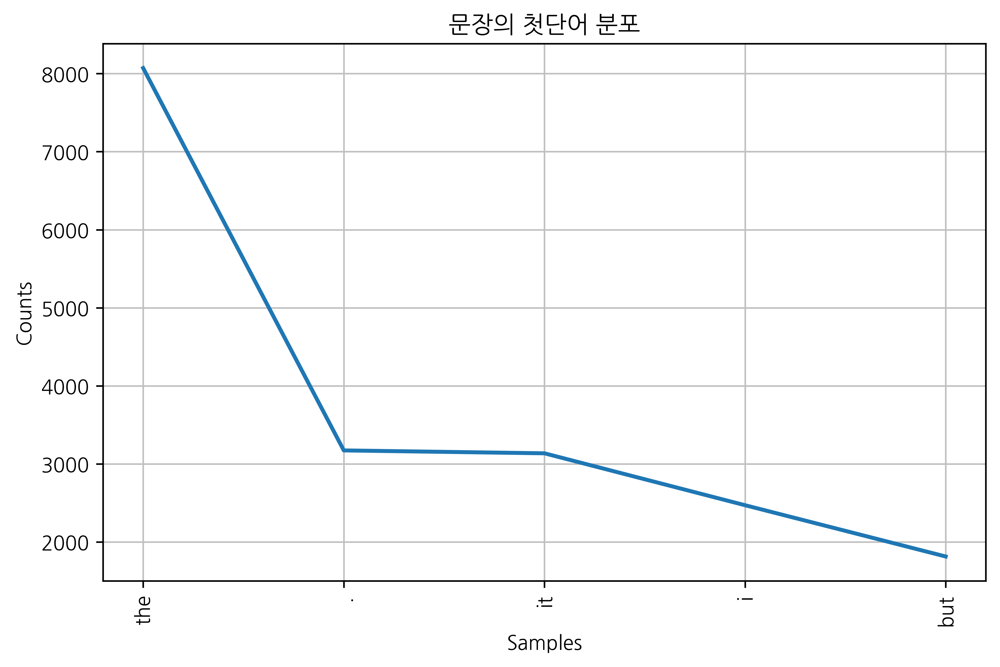

In [41]:
cfd["SS"].plot(5, title="문장의 첫단어 분포")
plt.show()

- i 다음에 올 수 있는 단어들

In [42]:
cfd["i"].most_common(5)

[("'", 1357), ('was', 506), ('can', 351), ('have', 330), ('don', 276)]

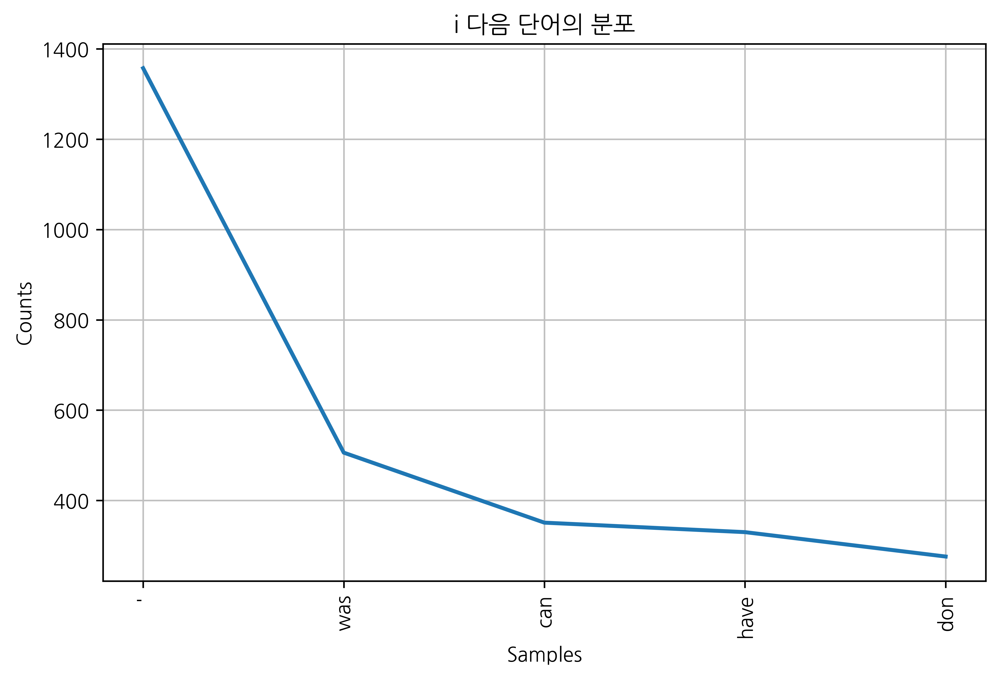

In [43]:
cfd["i"].plot(5, title="i 다음 단어의 분포")
plt.show()

- 마침표 다음에 올 수 있는 단어들

In [44]:
cfd["."].most_common(5)

[('SE', 63404), ('"', 1854), (')', 535), ("'", 70), (']', 10)]

### step 3: 조건부 확률 추정

In [46]:
from nltk.probability import ConditionalProbDist, MLEProbDist

cpd = ConditionalProbDist(cfd, MLEProbDist)

학습이 끝나면 조건부 확률의 값을 보거나 샘플 문장을 입력해서 문장의 확률을 구할 수 있다.

In [47]:
cpd["i"].prob("am") # i 다음 am 이 나온 확률.

0.018562267971650354

In [48]:
cpd["i"].prob("is")

0.0002249971875351558

In [49]:
cpd["we"].prob("are")

0.08504504504504505

In [50]:
cpd["i"].prob("is")

0.0002249971875351558

### step 4: 문장 확률 계산

조건부 확률을 알게 되면 각 문장의 확률을 구할 수 있다.

다음으로 이 토큰열을 N-그램형태로 분해한다. 바이그램 모형에서는 전체문장의 확률은 다음과 같이 조건부 확륭의 곱으로 나타난다.

P(SS I am a boy SE) = P(I | SS) * P(am | I) * P(a | am) * P(boy | a) * P(. | boy) * P(SE | .)

In [51]:
def sentence_score(s):
    p = 0.0
    for i in range(len(s) - 1):
        c = s[i]
        w = s[i + 1]
        p += np.log(cpd[c].prob(w) + np.finfo(float).eps) # prob이 0이 되는 것을 방지하기 위해 실수중 가장 작은숫자 입력
    return np.exp(p)

In [52]:
# 십만게 단어중 아래정도의 확률은 굉장히 높은 확률이다.
test_sentence = ["i", "like", "the", "movie", "."]
sentence_score(test_sentence)

2.740764134071561e-06

In [53]:
test_sentence = ["like", "i", "the", "movie", "."]
sentence_score(test_sentence)

1.0088151944997699e-20

### step 5: 무작위 문장생성

In [54]:
def generate_sentence(seed=None):
    if seed is not None:
        import random
        random.seed(seed)
    c = "SS"
    sentence = []
    while True:
        if c not in cpd:
            braek
        w = cpd[c].generate()
        
        if w == "SE":
            break
        else:
            w2 = w
            
        if c == "SS":
            sentence.append(w2.title())
        else:
            sentence.append(" " + w2)
            
        c = w
    return "".join(sentence)
        
# SS다음에 나올 단어의 확률에 분포에따라 첫 단어 선택. 첫 단어 다음에 나올 단어의
# 확률 분포에 따라 그 다음단어 선택. SE가 나올 때 까지 실행.

In [57]:
generate_sentence()

'Sourabaya and very great demand for the beginning to be entertained .'

In [63]:
from soynlp import DoublespaceLineCorpus

# 문서 단위 말뭉치 생성 
corpus = DoublespaceLineCorpus("2016-10-20.txt")
len(corpus)  # 문서의 갯수

30091

In [64]:
# 앞 5개의 문서 인쇄
i = 0
for d in corpus:
    print(i, d)
    i += 1
    if i > 4:
        break

0 
1 19  1990  52 1 22
2 오패산터널 총격전 용의자 검거 서울 연합뉴스 경찰 관계자들이 19일 오후 서울 강북구 오패산 터널 인근에서 사제 총기를 발사해 경찰을 살해한 용의자 성모씨를 검거하고 있다 성씨는 검거 당시 서바이벌 게임에서 쓰는 방탄조끼에 헬멧까지 착용한 상태였다 독자제공 영상 캡처 연합뉴스  서울 연합뉴스 김은경 기자 사제 총기로 경찰을 살해한 범인 성모 46 씨는 주도면밀했다  경찰에 따르면 성씨는 19일 오후 강북경찰서 인근 부동산 업소 밖에서 부동산업자 이모 67 씨가 나오기를 기다렸다 이씨와는 평소에도 말다툼을 자주 한 것으로 알려졌다  이씨가 나와 걷기 시작하자 성씨는 따라가면서 미리 준비해온 사제 총기를 이씨에게 발사했다 총알이 빗나가면서 이씨는 도망갔다 그 빗나간 총알은 지나가던 행인 71 씨의 배를 스쳤다  성씨는 강북서 인근 치킨집까지 이씨 뒤를 쫓으며 실랑이하다 쓰러뜨린 후 총기와 함께 가져온 망치로 이씨 머리를 때렸다  이 과정에서 오후 6시 20분께 강북구 번동 길 위에서 사람들이 싸우고 있다 총소리가 났다 는 등의 신고가 여러건 들어왔다  5분 후에 성씨의 전자발찌가 훼손됐다는 신고가 보호관찰소 시스템을 통해 들어왔다 성범죄자로 전자발찌를 차고 있던 성씨는 부엌칼로 직접 자신의 발찌를 끊었다  용의자 소지 사제총기 2정 서울 연합뉴스 임헌정 기자 서울 시내에서 폭행 용의자가 현장 조사를 벌이던 경찰관에게 사제총기를 발사해 경찰관이 숨졌다 19일 오후 6시28분 강북구 번동에서 둔기로 맞았다 는 폭행 피해 신고가 접수돼 현장에서 조사하던 강북경찰서 번동파출소 소속 김모 54 경위가 폭행 용의자 성모 45 씨가 쏜 사제총기에 맞고 쓰러진 뒤 병원에 옮겨졌으나 숨졌다 사진은 용의자가 소지한 사제총기  신고를 받고 번동파출소에서 김창호 54 경위 등 경찰들이 오후 6시 29분께 현장으로 출동했다 성씨는 그사이 부동산 앞에 놓아뒀던 가방을 챙겨 오패산 쪽으로 도망간 후였다  김 경위는 오패산 터널 입구 오른쪽의 급경

In [66]:
# 문장 단위 말뭉치 생성
corpus = DoublespaceLineCorpus("2016-10-20.txt", iter_sent=True)
len(corpus) # 문장의 갯수

223357

In [67]:
# 앞 5개의 문장 인쇄
i = 0
for d in corpus:
    print(i, d)
    i += 1
    if i > 4:
        break

0 19
1 1990
2 52 1 22
3 오패산터널 총격전 용의자 검거 서울 연합뉴스 경찰 관계자들이 19일 오후 서울 강북구 오패산 터널 인근에서 사제 총기를 발사해 경찰을 살해한 용의자 성모씨를 검거하고 있다 성씨는 검거 당시 서바이벌 게임에서 쓰는 방탄조끼에 헬멧까지 착용한 상태였다 독자제공 영상 캡처 연합뉴스
4 서울 연합뉴스 김은경 기자 사제 총기로 경찰을 살해한 범인 성모 46 씨는 주도면밀했다


In [68]:
%%time
from soynlp.word import WordExtractor

word_extractor = WordExtractor()
word_extractor.train(corpus)

training was done. used memory 0.746 Gbse memory 0.813 Gb
Wall time: 47.5 s


In [69]:
word_score = word_extractor.extract()

all cohesion probabilities was computed. # words = 223348
all branching entropies was computed # words = 360721
all accessor variety was computed # words = 360721


### word2vec

In [70]:
import nltk
nltk.download('movie_reviews')

[nltk_data] Downloading package movie_reviews to
[nltk_data]     C:\Users\samsung\AppData\Roaming\nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!


True

In [71]:
from nltk.corpus import movie_reviews
sentences = [list(s) for s in movie_reviews.sents()]

In [72]:
from gensim.models.word2vec import Word2Vec

In [73]:
model = Word2Vec(sentences)

In [75]:
model.init_sims(replace=True) # 필요없는 메모리 삭제. 안해도 무방

In [76]:
model.wv.similarity('actor', 'actress')

0.8957571

In [77]:
model.wv.similarity('he', 'she')

0.8607266

In [78]:
model.wv.similarity('actor', 'she')

0.27117866

In [79]:
model.wv.most_similar("accident")

[('hotel', 0.8769944906234741),
 ('bus', 0.8748364448547363),
 ('deserted', 0.8673768043518066),
 ('investigation', 0.8667889833450317),
 ('diner', 0.8659436702728271),
 ('escapes', 0.8653779625892639),
 ('truck', 0.8652347326278687),
 ('meeting', 0.859381377696991),
 ('prison', 0.8569014072418213),
 ('murdered', 0.856600284576416)]

In [80]:
model.wv.most_similar(positive=['she', 'actor'], negative='actress', topn=1)

[('he', 0.3028927147388458)]

### 이미지 처리 기초

그레이스케일

In [82]:
import scipy as sp

img_gray = sp.misc.face(gray=True)
img_gray.shape

(768, 1024)

Pillow를 이용한 이미지 처리

In [83]:
import PIL
PIL.__version__

'6.2.0'

In [84]:
from PIL import Image

img_logo_png = Image.open("./logo.png")
img_logo_png.size

(798, 1002)

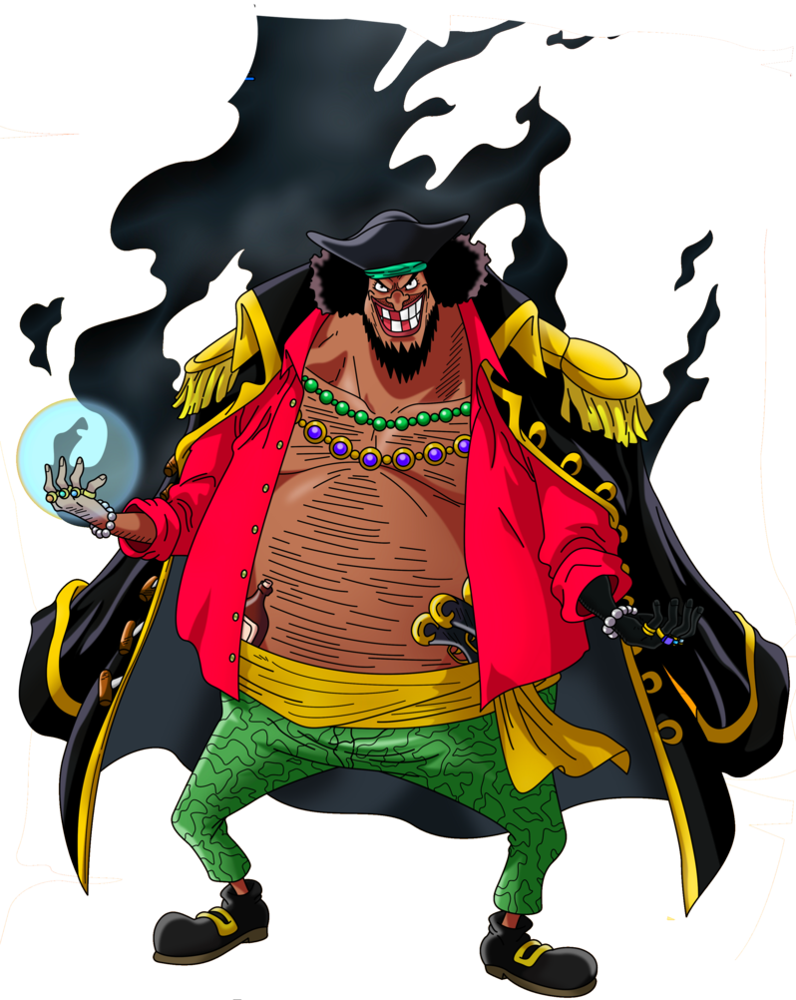

In [85]:
img_logo_png

In [87]:
img_logo_png.save("./logo.bmp")
img_logo_bmp = Image.open("./logo.bmp")

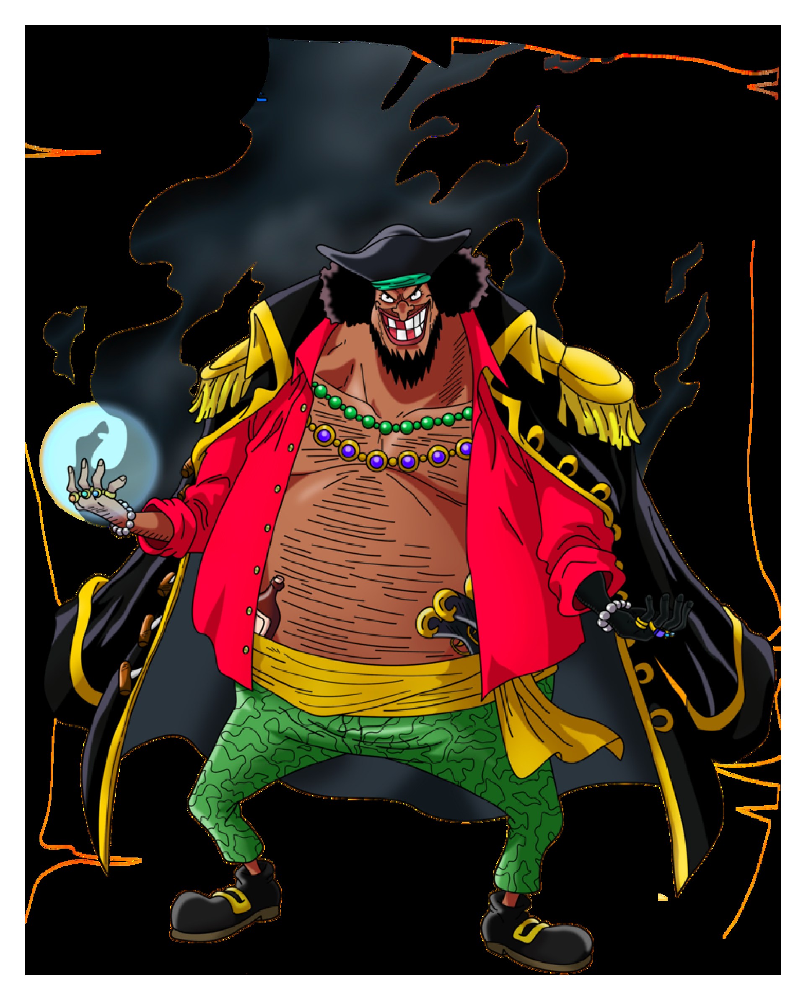

In [88]:
img_logo_array = np.array(img_logo_bmp)

plt.imshow(img_logo_array)
plt.axis("off")
plt.show()

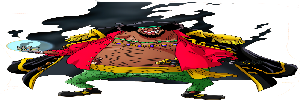

In [89]:
img_logo_png2 = img_logo_png.resize((300, 100))
img_logo_png2

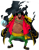

In [90]:
img_logo_thumbnail = img_logo_png.copy()
img_logo_thumbnail.thumbnail((150, 50))
img_logo_thumbnail

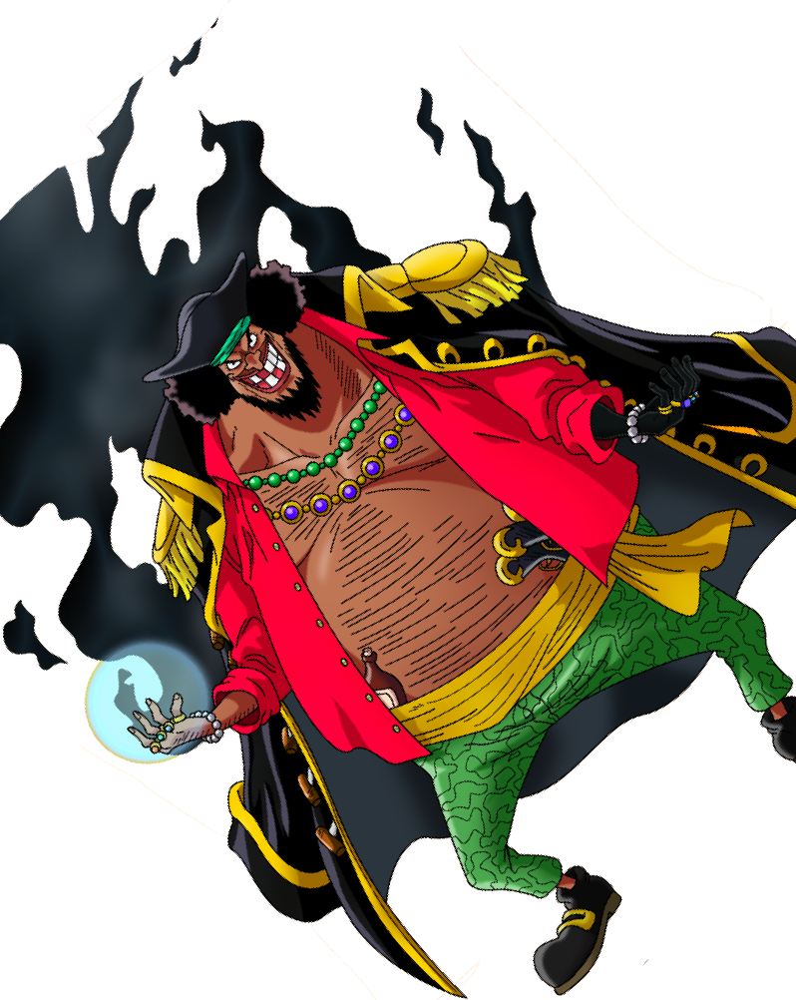

In [92]:
img_logo_rotated = img_logo_png.rotate(46)
img_logo_rotated

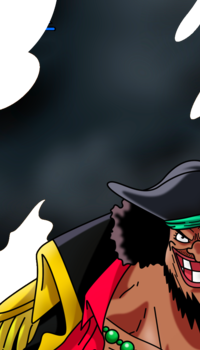

In [105]:
img_logo_cropped = img_logo_png.crop((200, 50, 400, 400)) # 왼쪽 두 개 좌상단, 우측 두 개 우하단
img_logo_cropped

### Scikit-Image
    - 다른 패키지로 대체가 가능하여 이미지를 가져오는 용도로만 사용 예정

In [106]:
import skimage
skimage.__version__

'0.15.0'

In [107]:
import skimage.data

img_astro = skimage.data.astronaut()
img_astro.shape

(512, 512, 3)

In [108]:
skimage.io.imsave("astronaut.png", img_astro)
img_astro2 = skimage.io.imread("astronaut.png")

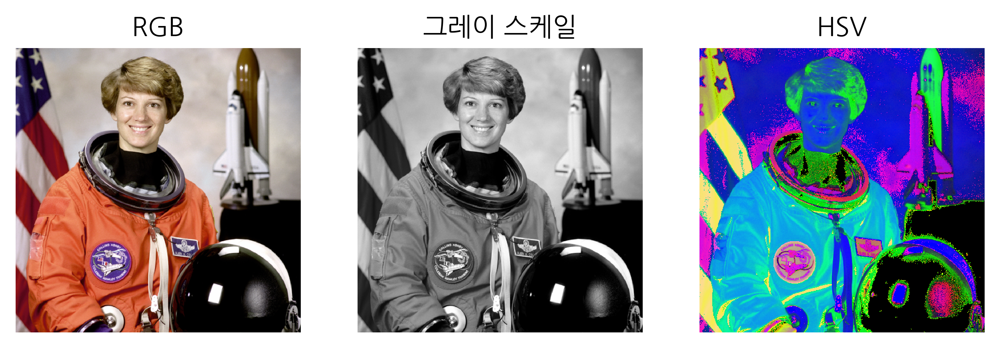

In [111]:
from skimage import color

plt.subplot(131)
plt.imshow(img_astro)
plt.axis("off")
plt.title("RGB")

plt.subplot(132)
plt.imshow(color.rgb2gray(img_astro), cmap=plt.cm.gray)
plt.axis("off")
plt.title("그레이 스케일")

plt.subplot(133)
plt.imshow(color.rgb2hsv(img_astro))
plt.axis("off")
plt.title("HSV")

plt.show()

In [112]:
import cv2
cv2.__version__

'4.2.0'

In [113]:
img_astro3 = cv2.imread("./astronaut.png")
img_astro3.shape

(512, 512, 3)

In [114]:
# 각 채널을 분리
b, g, r = cv2.split(img_astro3)

# b, r을 서로 바꿔서 Merge
img_astro3_rgb = cv2.merge([r, g, b])



### 이미지 필터링

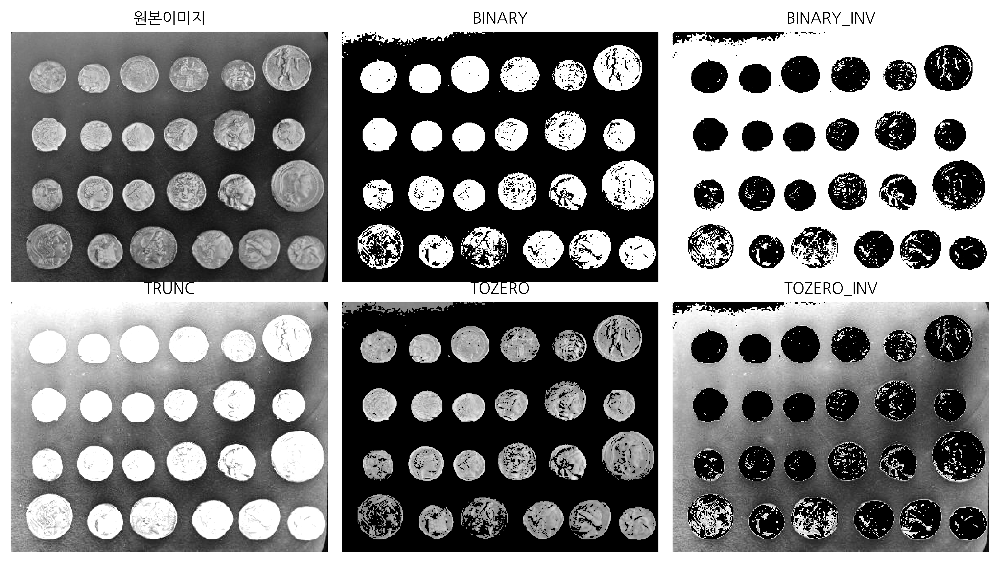

In [115]:
import cv2
from skimage.data import coins

img = coins()

maxval = 255
thresh = maxval / 2

# 원본이미지는 필요없어 _로 받음
_, thresh1 = cv2.threshold(img, thresh, maxval, cv2.THRESH_BINARY)
_, thresh2 = cv2.threshold(img, thresh, maxval, cv2.THRESH_BINARY_INV)
_, thresh3 = cv2.threshold(img, thresh, maxval, cv2.THRESH_TRUNC)
_, thresh4 = cv2.threshold(img, thresh, maxval, cv2.THRESH_TOZERO)
_, thresh5 = cv2.threshold(img, thresh, maxval, cv2.THRESH_TOZERO_INV)

titles = ['원본이미지', 'BINARY', 'BINARY_INV', 'TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

plt.figure(figsize=(9, 5))
for i in range(6):
    plt.subplot(2, 3, i+1), plt.imshow(images[i], 'gray')
    plt.title(titles[i], fontdict={'fontsize': 10})
    plt.axis('off')

plt.tight_layout(pad=0.7)
plt.show()

연습문제 1
- 임계처리를 하고 오프닝과 클로징, 블러링 사용

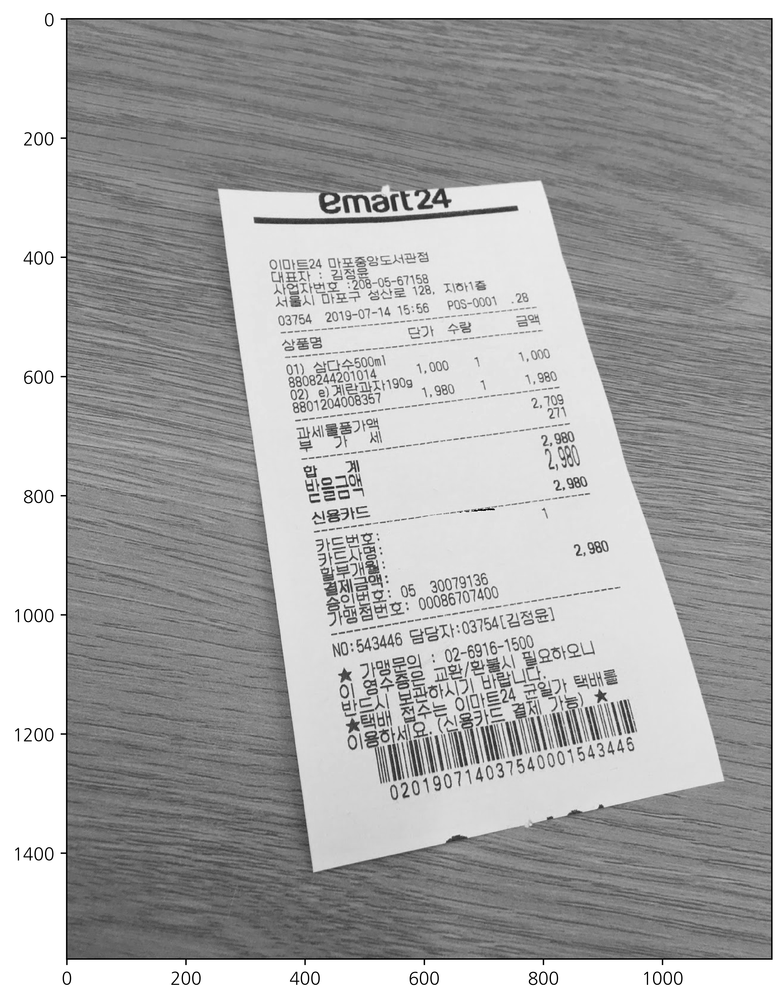

In [188]:
import cv2

img = cv2.imread("./receipt.png")
img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

plt.figure(figsize=(10, 10))
plt.imshow(img, cmap=plt.cm.gray)
plt.grid(False)
plt.show()

In [189]:
# 글자처럼 자잘한 것을 없애려면 closing사용 -> 경계선을 밀어넣었다 댕김. -> 글자같이
# 자잘한 애들은 밀어넣는 순간 없어짐. -> 그 다음 점점으로 남음 -> 미디엄 블러로 없앰

img_region = cv2.bilateralFilter(img, 30, 30, 30)
_, img_region = cv2.threshold(img_region, 180, 255, cv2.THRESH_BINARY)
img_region = cv2.medianBlur(img_region, 11)
img_region = cv2.morphologyEx(img_region, cv2.MORPH_CLOSE,
    cv2.getStructuringElement(cv2.MORPH_RECT, (30, 30)),
)

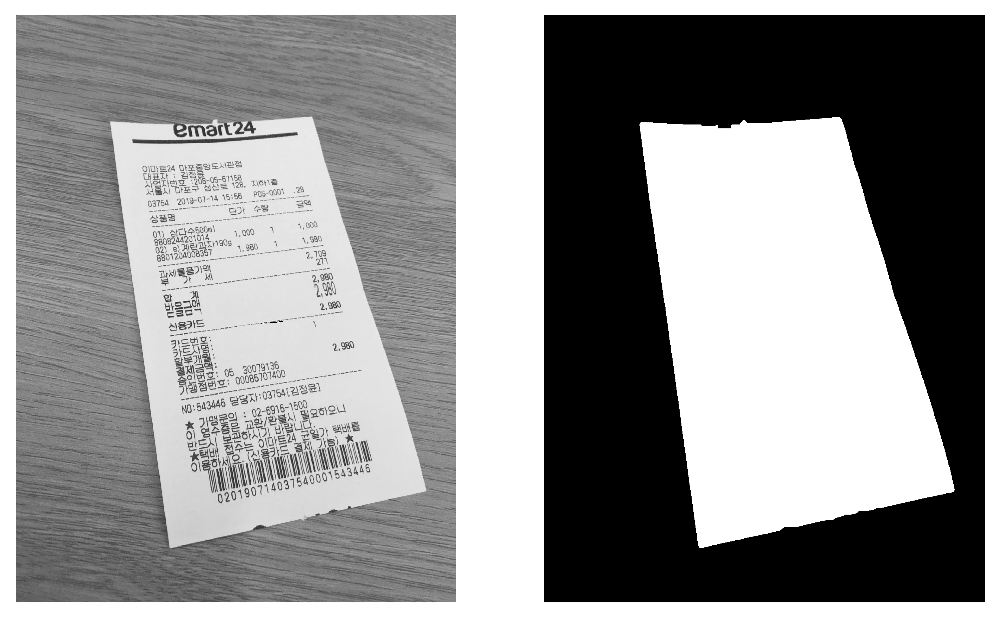

In [190]:
plt.subplot(121)
plt.imshow(img, cmap=plt.cm.gray)
plt.axis("off")
plt.subplot(122)
plt.imshow(img_region, cmap=plt.cm.gray)
plt.axis("off")
plt.show()

### 컨투어

In [141]:
# 4.0 이상 버전은 노트북에서 images만 지우면 됨 
import cv2
from skimage.data import horse

img_raw = horse().astype('uint8')
img_raw = np.ones(img_raw.shape) - img_raw

img = img_raw.copy().astype('uint8')

contours, hierachy = cv2.findContours(img, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)
# 컨투어는 튜플의 리스트의 리스트

In [142]:
# 두 개의 라인이 컨투어로 잡혔다.
len(contours)

2

In [144]:
# 0번 컨투어 라인의 모양
contours[0].shape

(312, 1, 2)

In [147]:
# 아래의 점들이 이어진게 컨투어 라인
np.squeeze(contours[0])[:5]

array([[350,   9],
       [346,  13],
       [345,  13],
       [339,  19],
       [330,  20]], dtype=int32)

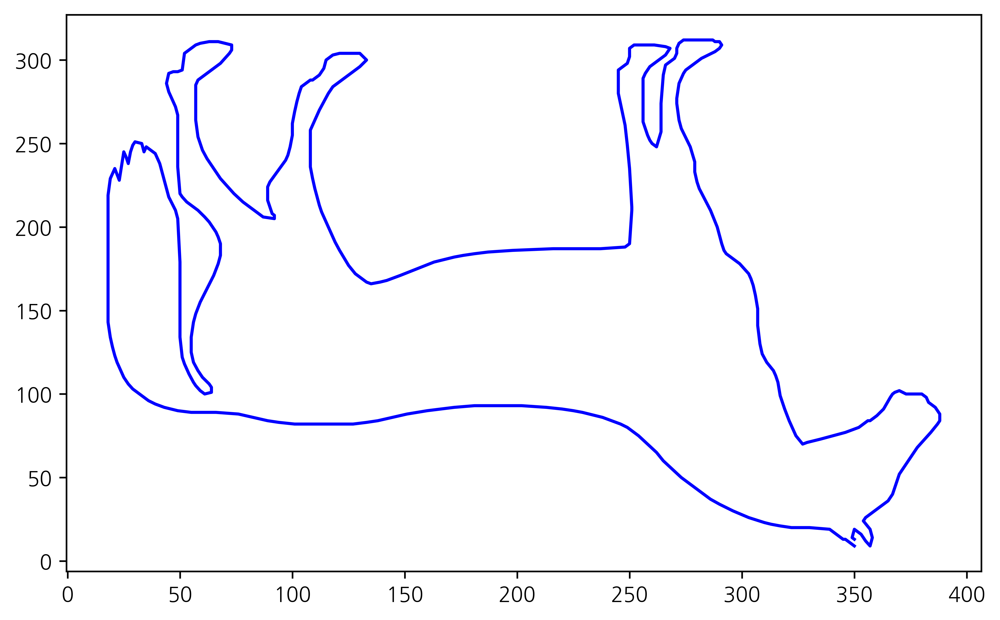

In [148]:
# 가장 중요한 명령! zip + *은 가로 페어를 세로 페어로 바꿔줌
x0, y0 = zip(*np.squeeze(contours[0]))
plt.plot(x0, y0, c="b")
plt.show()

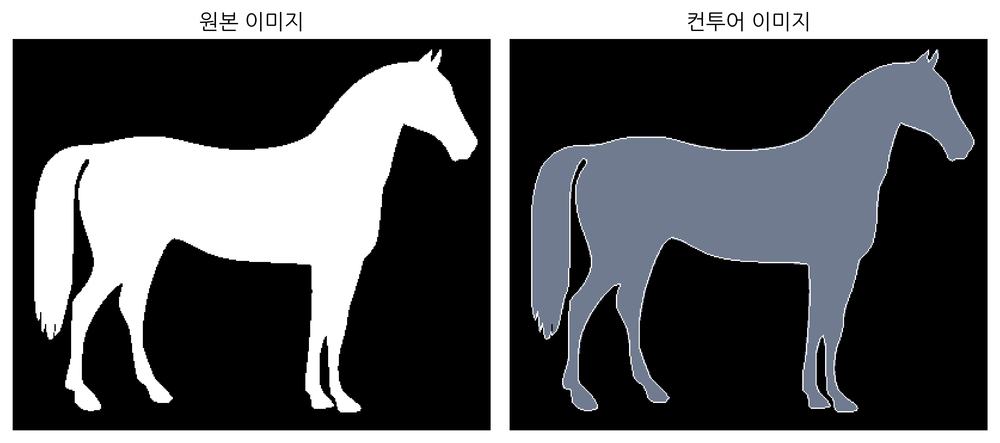

In [149]:
image = cv2.drawContours(img, contours, 0, 2)

plt.subplot(1, 2, 1)
plt.imshow(img_raw, cmap='bone')
plt.title("원본 이미지")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(image, cmap='bone')
plt.title("컨투어 이미지")
plt.axis('off')
plt.tight_layout()
plt.show()

In [151]:
c0 = contours[0]
M = cv2.moments(c0)
M

{'m00': 42355.0,
 'm10': 7943000.166666666,
 'm01': 6115675.833333333,
 'm20': 1914995009.1666665,
 'm11': 1043128904.8333333,
 'm02': 1041817606.0,
 'm30': 517465951777.85004,
 'm21': 233874687443.69998,
 'm12': 169430720481.3,
 'm03': 200904428563.85,
 'mu20': 425412866.6175771,
 'mu11': -103767899.87557864,
 'mu02': 158769774.61250484,
 'mu30': -1219318387.8395386,
 'mu21': -3713125246.697487,
 'mu12': 4020833974.2852783,
 'mu03': 4625649126.278534,
 'nu20': 0.2371380524771235,
 'nu11': -0.0578433790256196,
 'nu02': 0.08850309451896964,
 'nu30': -0.003302595676372647,
 'nu21': -0.010057218449154588,
 'nu12': 0.010890665663146169,
 'nu03': 0.012528843128440374}

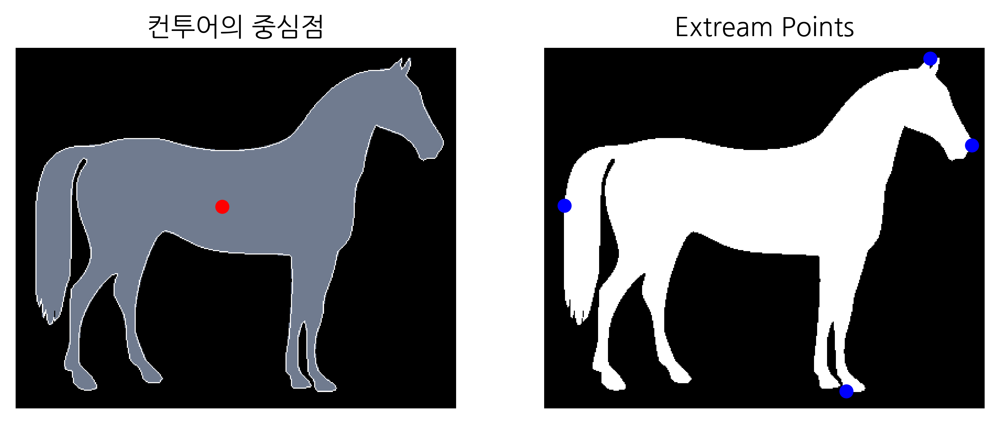

In [152]:
cx = int(M['m10'] / M['m00'])
cy = int(M['m01'] / M['m00'])
leftmost = tuple(c0[c0[:, :, 0].argmin()][0])
rightmost = tuple(c0[c0[:, :, 0].argmax()][0])
topmost = tuple(c0[c0[:, :, 1].argmin()][0])
bottommost = tuple(c0[c0[:, :, 1].argmax()][0])

plt.subplot(1,2,1)
plt.imshow(image, cmap='bone')
plt.title("컨투어의 중심점")
plt.axis('off')
plt.scatter([cx], [cy], c="r", s=30)

plt.subplot(1,2,2)
plt.imshow(img_raw, cmap='bone')
plt.axis("off")
plt.scatter(
    [leftmost[0], rightmost[0], topmost[0], bottommost[0]], 
    [leftmost[1], rightmost[1], topmost[1], bottommost[1]], 
    c="b", s=30)
plt.title("Extream Points")

plt.show()

연습문제 2

In [191]:
contours, hierachy = cv2.findContours(img_region, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)

In [192]:
len(contours)

1

In [193]:
contours[0].shape

(266, 1, 2)

In [194]:
np.squeeze(contours[0])[:5]

array([[786, 273],
       [773, 274],
       [761, 275],
       [748, 276],
       [739, 278]], dtype=int32)

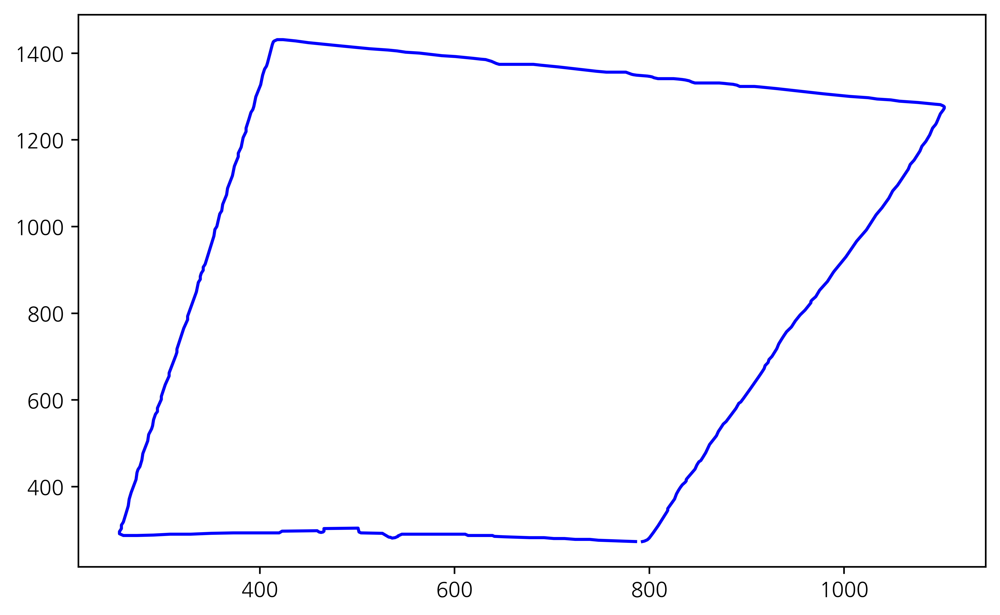

In [195]:
x0, y0 = zip(*np.squeeze(contours[0]))
plt.plot(x0, y0, c="b")
plt.show()

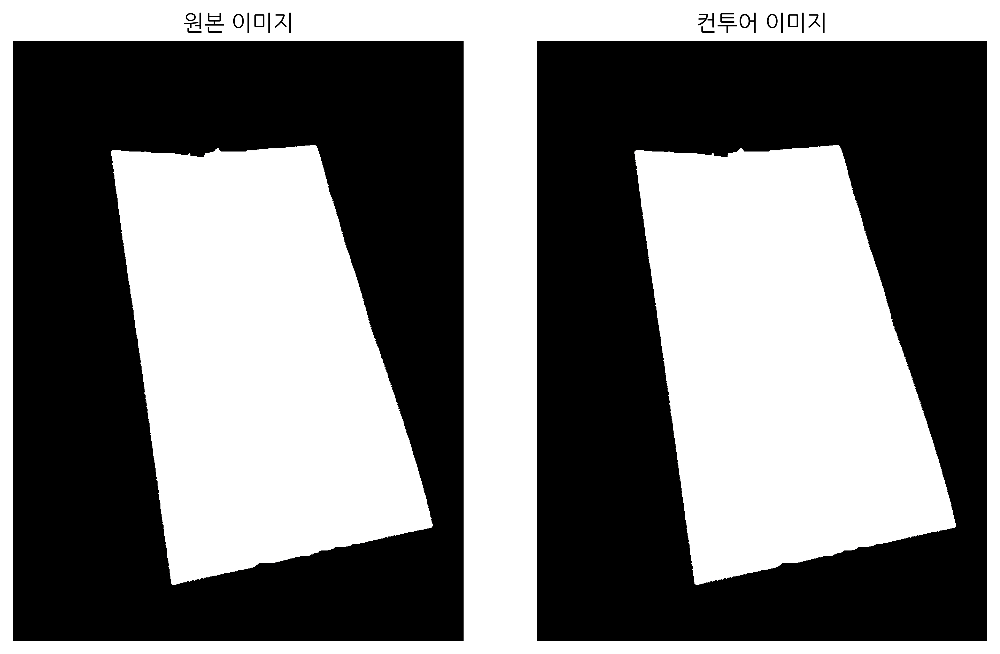

In [196]:
image = cv2.drawContours(img_region, contours, 0, 2)

plt.subplot(1, 2, 1)
plt.imshow(img_region, cmap='bone')
plt.title("원본 이미지")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(image, cmap='bone')
plt.title("컨투어 이미지")
plt.axis('off')
plt.tight_layout()
plt.show()

In [197]:
c0 = contours[0]
M = cv2.moments(c0)
M

{'m00': 677900.5,
 'm10': 436931814.0,
 'm01': 574869115.5,
 'm20': 306662276874.75,
 'm11': 381495955592.7916,
 'm02': 552032977712.5833,
 'm30': 230675195144452.8,
 'm21': 274788078993294.38,
 'm12': 373019539458745.6,
 'm03': 575929239695706.2,
 'mu20': 25043646876.202087,
 'mu11': 10971659699.82428,
 'mu02': 64535918843.68976,
 'mu30': 736971116230.9688,
 'mu21': 590897821907.8672,
 'mu12': -1394267514682.6719,
 'mu03': -1657180128098.875,
 'nu20': 0.05449613008836627,
 'nu11': 0.023874837288776853,
 'nu02': 0.14043313444177255,
 'nu30': 0.001947760622359324,
 'nu21': 0.0015616996161750966,
 'nu12': -0.003684946807715326,
 'nu03': -0.004379805567109594}

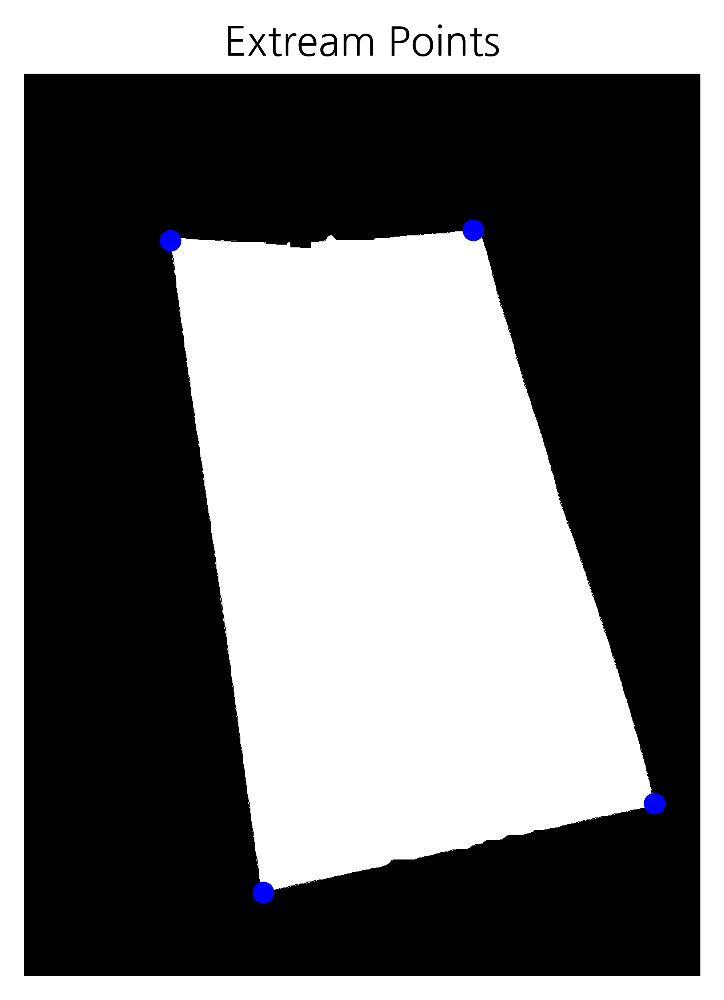

In [198]:
leftmost = tuple(c0[c0[:, :, 0].argmin()][0])
rightmost = tuple(c0[c0[:, :, 0].argmax()][0])
topmost = tuple(c0[c0[:, :, 1].argmin()][0])
bottommost = tuple(c0[c0[:, :, 1].argmax()][0])

plt.subplot(1,2,2)
plt.imshow(img_region, cmap='bone')
plt.axis("off")
plt.scatter(
    [leftmost[0], rightmost[0], topmost[0], bottommost[0]], 
    [leftmost[1], rightmost[1], topmost[1], bottommost[1]], 
    c="b", s=30)
plt.title("Extream Points")

plt.show()